# Otter Image Demo (In-context Learning)

Here is an example of multi-modal ICL (in-context learning) with 🦦 Otter. We provide two demo images with corresponding instructions and answers, then we ask the model to generate an answer given our instruct. You may change your instruction and see how the model responds.

You can also try our [online demo](https://otter.cliangyu.com/) to see more in-context learning demonstrations.

In [17]:
import requests
import torch
import transformers
from PIL import Image
import sys

sys.path.append("../..")
from otter.modeling_otter import OtterForConditionalGeneration

In [18]:
model = OtterForConditionalGeneration.from_pretrained("/home/ueno/Otter/weights/OTTER-Image-MPT7B", device_map="auto")
tokenizer = model.text_tokenizer
image_processor = transformers.CLIPImageProcessor()

Using pad_token, but it is not set yet.


You are using config.init_device='cpu', but you can also use config.init_device="meta" with Composer + FSDP for fast initialization.
The current model version is configured for Otter-Image with max_num_frames set to None.
Total Trainable param: 1.385404 B


The model weights are not tied. Please use the `tie_weights` method before using the `infer_auto_device` function.
Loading checkpoint shards: 100%|██████████| 4/4 [00:18<00:00,  4.57s/it]


In [19]:
model_name = "context_true"
trained_ckpt_path = f'../../log/{model_name}/final_weights.pt'

train_ckpt = torch.load(trained_ckpt_path, map_location="cpu")
if train_ckpt.get("model_state_dict", None) is not None:
    train_ckpt = train_ckpt["model_state_dict"]
_ = model.load_state_dict(train_ckpt, strict=False)

In [9]:
demo_image_one = Image.open(requests.get("http://images.cocodataset.org/val2017/000000039769.jpg", stream=True).raw)
demo_image_two = Image.open(requests.get("http://images.cocodataset.org/test-stuff2017/000000028137.jpg", stream=True).raw)
query_image = Image.open(requests.get("http://images.cocodataset.org/test-stuff2017/000000028352.jpg", stream=True).raw)
vision_x = image_processor.preprocess([demo_image_one, demo_image_two, query_image], return_tensors="pt")["pixel_values"].unsqueeze(1).unsqueeze(0)
model.text_tokenizer.padding_side = "left"
lang_x = model.text_tokenizer(
    [
        "<image>User: a photo of GPT:<answer> two cats sleeping.<|endofchunk|><image>User: a photo of GPT:<answer> a bathroom sink.<|endofchunk|><image>User: a photo of GPT:<answer>"
    ],
    return_tensors="pt",
)

# Get the data type from model's parameters
model_dtype = next(model.parameters()).dtype

# Convert tensors to the model's data type
vision_x = vision_x.to(dtype=model_dtype)
lang_x_input_ids = lang_x["input_ids"]
lang_x_attention_mask = lang_x["attention_mask"]

bad_words_id = model.text_tokenizer(["User:", "GPT1:", "GFT:", "GPT:"], add_special_tokens=False).input_ids
generated_text = model.generate(
    vision_x=vision_x.to(model.device),
    lang_x=lang_x_input_ids.to(model.device),
    attention_mask=lang_x_attention_mask.to(model.device),
    max_new_tokens=512,
    num_beams=3,
    no_repeat_ngram_size=3,
    bad_words_ids=bad_words_id,
)

parsed_output = (
    model.text_tokenizer.decode(generated_text[0]).split("<answer>")[-1].lstrip().rstrip().split("<|endofchunk|>")[0].lstrip().rstrip().lstrip('"').rstrip('"')
)

print("Generated text: ", parsed_output)

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


Generated text:  a table filled with food.


In [10]:
import os
def get_image_paths(folder_path):
    image_extensions = ['.jpg', '.jpeg', '.png']  # 画像の拡張子リスト
    all_files = sorted(os.listdir(folder_path)) # フォルダ内の全てのファイルを取得
    image_paths = [os.path.join(folder_path, file) for file in all_files if os.path.splitext(file)[1].lower() in image_extensions] # 画像のパスを抽出してリストに格納
    return image_paths

def write_text_file(file_path, text):
    with open(file_path, mode="a") as f:
        f.write(text+"\n")
        
def generate_list_string(items):
    # アンダースコアをスペースに変換
    items = [item.replace('_', ' ') for item in items]
    if len(items) == 1:
        return items[0]
    elif len(items) == 2:
        return f"{items[0]} and {items[1]}"
    else:
        return ", ".join(items[:-1]) + f", and {items[-1]}"

In [11]:
import textwrap
import random
import base64
import matplotlib.pyplot as plt
from PIL import Image
from io import BytesIO

def test(folder__, sub__, GTs):
    subfolder_string = generate_list_string(GTs)
    query_folder_path = f"/data/dataset/mvtec/{folder__}/test/{sub__}"
    query_folder_path = f"/data/dataset/mvtec/{folder__}/test/good"
    query_image_paths = get_image_paths(query_folder_path)


    demo_image_one = Image.open(f"/data/dataset/mvtec/{folder__}/test/good/000.png").resize((224, 224)).convert("RGB")
    demo_image_two = Image.open(f"/data/dataset/mvtec/{folder__}/test/{sub__}/000.png").resize((224, 224)).convert("RGB")

    for i, query_image_path in enumerate(query_image_paths[1:]):
        query_image = Image.open(query_image_path).resize((224, 224)).convert("RGB")            
                
        vision_x = image_processor.preprocess([demo_image_one, demo_image_two, query_image], return_tensors="pt")["pixel_values"].unsqueeze(1).unsqueeze(0)
        model.text_tokenizer.padding_side = "left"

        inputs = textwrap.dedent(f"""
                        <image>User: This is an image of {folder__}. Does this {folder__} have any defects such as {subfolder_string}? GPT:<answer>No. This {folder__} does not have any defects such as {subfolder_string}, so it is non-defective.<|endofchunk|>
                        <image>User: This is an image of {folder__}. Does this {folder__} have any defects such as {subfolder_string}? GPT:<answer>Yes. This {folder__} has some {gt}, so it is defective.<|endofchunk|>
                        <image>User: This is an image of {folder__}. Does this {folder__} have any defects such as {subfolder_string}? GPT:<answer>
        """)
        inputs = "".join(inputs.split("\n"))
        lang_x = model.text_tokenizer(
            [
                inputs
            ],
            return_tensors="pt",
        )

        # print(vision_x.shape) # torch.Size([1, 3, 1, 3, 224, 224]) shape (B, num_imgs, Frames=1, C, H, W)

        fig, axes = plt.subplots(1, 3, figsize=(10, 4))
        axes[0].imshow(demo_image_one)
        axes[0].axis('off')
        axes[1].imshow(demo_image_two)
        axes[1].axis('off')
        axes[2].imshow(query_image)
        axes[2].axis('off')
        plt.tight_layout()
        plt.show()

        # Get the data type from model's parameters
        model_dtype = next(model.parameters()).dtype

        # Convert tensors to the model's data type
        vision_x = vision_x.to(dtype=model_dtype)
        lang_x_input_ids = lang_x["input_ids"]
        lang_x_attention_mask = lang_x["attention_mask"]

        bad_words_id = model.text_tokenizer(["User:", "GPT1:", "GFT:", "GPT:"], add_special_tokens=False).input_ids
        generated_text = model.generate(
            vision_x=vision_x.to(model.device),
            lang_x=lang_x_input_ids.to(model.device),
            attention_mask=lang_x_attention_mask.to(model.device),
            max_new_tokens=512,
            num_beams=3,
            no_repeat_ngram_size=3,
            bad_words_ids=bad_words_id,
        )

        parsed_output = (
            model.text_tokenizer.decode(generated_text[0]).split("<answer>")[-1].lstrip().rstrip().split("<|endofchunk|>")[0].lstrip().rstrip().lstrip('"').rstrip('"')
        )
        print(inputs)
        print("Generated text: ", parsed_output)

In [20]:
folder__ = "wood"
sub__ = "color"
GTs = ["stained wood","scratched wood","wood with holes"]
gt = GTs[0]

In [21]:
import textwrap
from PIL import Image

folder__ = "wood"
sub__ = "color"
GTs = ["stained wood","scratched wood","wood with holes"]
gt = GTs[0]
subfolder_string = generate_list_string(GTs)
query_folder_path = f"/data/dataset/mvtec/{folder__}/test/{sub__}"
query_folder_path = f"/data/dataset/mvtec/{folder__}/test/good"
query_image_paths = get_image_paths(query_folder_path)


demo_image_one = Image.open(f"/data/dataset/mvtec/{folder__}/test/good/000.png").resize((224, 224)).convert("RGB")
demo_image_two = Image.open(f"/data/dataset/mvtec/{folder__}/test/{sub__}/000.png").resize((224, 224)).convert("RGB")

for i, query_image_path in enumerate(query_image_paths[1:]):
    query_image = Image.open(query_image_path).resize((224, 224)).convert("RGB")            
            
    vision_x = image_processor.preprocess([demo_image_one, demo_image_two, query_image], return_tensors="pt")["pixel_values"].unsqueeze(1).unsqueeze(0)
    model.text_tokenizer.padding_side = "left"

    inputs = textwrap.dedent(f"""
                    <image>User: This is an image of {folder__}. Does this {folder__} have any defects such as {subfolder_string}? GPT:<answer>No. This {folder__} does not have any defects such as {subfolder_string}, so it is non-defective.<|endofchunk|>
                    <image>User: This is an image of {folder__}. Does this {folder__} have any defects such as {subfolder_string}? GPT:<answer>Yes. This {folder__} has some {gt}, so it is defective.<|endofchunk|>
                    <image>User: This is an image of {folder__}. Does this {folder__} have any defects such as {subfolder_string}? GPT:<answer>
    """)
    inputs = "".join(inputs.split("\n"))
    lang_x = model.text_tokenizer(
        [
            inputs
        ],
        return_tensors="pt",
    )

    # Get the data type from model's parameters
    model_dtype = next(model.parameters()).dtype

    # Convert tensors to the model's data type
    vision_x = vision_x.to(dtype=model_dtype)
    lang_x_input_ids = lang_x["input_ids"]
    lang_x_attention_mask = lang_x["attention_mask"]

    bad_words_id = model.text_tokenizer(["User:", "GPT1:", "GFT:", "GPT:"], add_special_tokens=False).input_ids
    generated_text = model.generate(
        vision_x=vision_x.to(model.device),
        lang_x=lang_x_input_ids.to(model.device),
        attention_mask=lang_x_attention_mask.to(model.device),
        max_new_tokens=512,
        num_beams=3,
        no_repeat_ngram_size=3,
        bad_words_ids=bad_words_id,
    )

    parsed_output = (
        model.text_tokenizer.decode(generated_text[0]).split("<answer>")[-1].lstrip().rstrip().split("<|endofchunk|>")[0].lstrip().rstrip().lstrip('"').rstrip('"')
    )
    print(inputs)
    print("Generated text: ", parsed_output)

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>No. This wood does not have any defects such as stained wood, scratched wood, and wood with holes, so it is non-defective.<|endofchunk|><image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>Yes. This wood has some stained wood, so it is defective.<|endofchunk|><image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>
Generated text:  


Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>No. This wood does not have any defects such as stained wood, scratched wood, and wood with holes, so it is non-defective.<|endofchunk|><image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>Yes. This wood has some stained wood, so it is defective.<|endofchunk|><image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>
Generated text:  


Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>No. This wood does not have any defects such as stained wood, scratched wood, and wood with holes, so it is non-defective.<|endofchunk|><image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>Yes. This wood has some stained wood, so it is defective.<|endofchunk|><image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>
Generated text:  


Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>No. This wood does not have any defects such as stained wood, scratched wood, and wood with holes, so it is non-defective.<|endofchunk|><image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>Yes. This wood has some stained wood, so it is defective.<|endofchunk|><image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>
Generated text:  


Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>No. This wood does not have any defects such as stained wood, scratched wood, and wood with holes, so it is non-defective.<|endofchunk|><image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>Yes. This wood has some stained wood, so it is defective.<|endofchunk|><image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>
Generated text:  


Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>No. This wood does not have any defects such as stained wood, scratched wood, and wood with holes, so it is non-defective.<|endofchunk|><image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>Yes. This wood has some stained wood, so it is defective.<|endofchunk|><image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>
Generated text:  


Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>No. This wood does not have any defects such as stained wood, scratched wood, and wood with holes, so it is non-defective.<|endofchunk|><image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>Yes. This wood has some stained wood, so it is defective.<|endofchunk|><image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>
Generated text:  


Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>No. This wood does not have any defects such as stained wood, scratched wood, and wood with holes, so it is non-defective.<|endofchunk|><image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>Yes. This wood has some stained wood, so it is defective.<|endofchunk|><image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>
Generated text:  


Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>No. This wood does not have any defects such as stained wood, scratched wood, and wood with holes, so it is non-defective.<|endofchunk|><image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>Yes. This wood has some stained wood, so it is defective.<|endofchunk|><image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>
Generated text:  


Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>No. This wood does not have any defects such as stained wood, scratched wood, and wood with holes, so it is non-defective.<|endofchunk|><image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>Yes. This wood has some stained wood, so it is defective.<|endofchunk|><image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>
Generated text:  


Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>No. This wood does not have any defects such as stained wood, scratched wood, and wood with holes, so it is non-defective.<|endofchunk|><image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>Yes. This wood has some stained wood, so it is defective.<|endofchunk|><image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>
Generated text:  


Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>No. This wood does not have any defects such as stained wood, scratched wood, and wood with holes, so it is non-defective.<|endofchunk|><image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>Yes. This wood has some stained wood, so it is defective.<|endofchunk|><image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>
Generated text:  


Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>No. This wood does not have any defects such as stained wood, scratched wood, and wood with holes, so it is non-defective.<|endofchunk|><image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>Yes. This wood has some stained wood, so it is defective.<|endofchunk|><image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>
Generated text:  


Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>No. This wood does not have any defects such as stained wood, scratched wood, and wood with holes, so it is non-defective.<|endofchunk|><image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>Yes. This wood has some stained wood, so it is defective.<|endofchunk|><image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>
Generated text:  


Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>No. This wood does not have any defects such as stained wood, scratched wood, and wood with holes, so it is non-defective.<|endofchunk|><image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>Yes. This wood has some stained wood, so it is defective.<|endofchunk|><image>User: This is an image of wood. Does this wood have any defects such as stained wood, scratched wood, and wood with holes? GPT:<answer>
Generated text:  


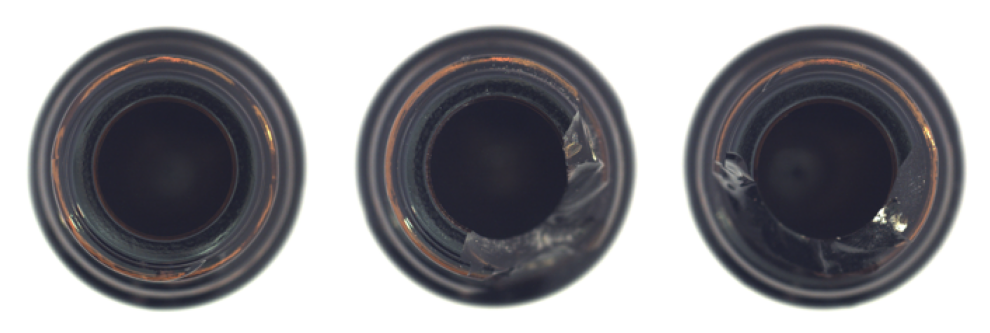

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>No. This bottle does not have any defects such as broken bottle and contaminated bottle, so it is non-defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>Yes. This bottle has some broken bottle, so it is defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>
Generated text:  Yes. This battery has some break bottle,so it is defectiv.


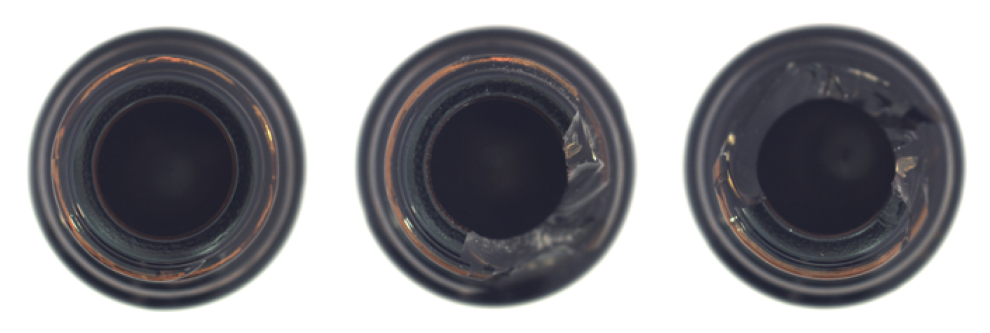

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>No. This bottle does not have any defects such as broken bottle and contaminated bottle, so it is non-defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>Yes. This bottle has some broken bottle, so it is defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>
Generated text:  Yes. This battery has some cracked battery,so it is defectiv.


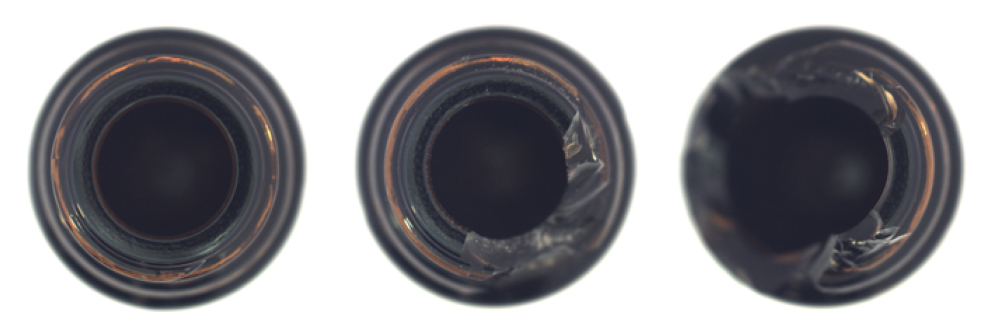

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>No. This bottle does not have any defects such as broken bottle and contaminated bottle, so it is non-defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>Yes. This bottle has some broken bottle, so it is defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>
Generated text:  Yes. This bowl has some cracked bowl,so it is defectiv.


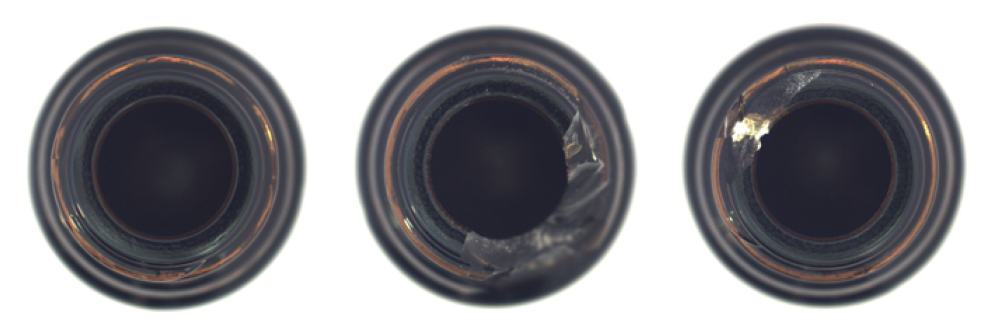

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>No. This bottle does not have any defects such as broken bottle and contaminated bottle, so it is non-defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>Yes. This bottle has some broken bottle, so it is defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>
Generated text:  YES. This bowl has some cracked bottle,so it is defectiv.


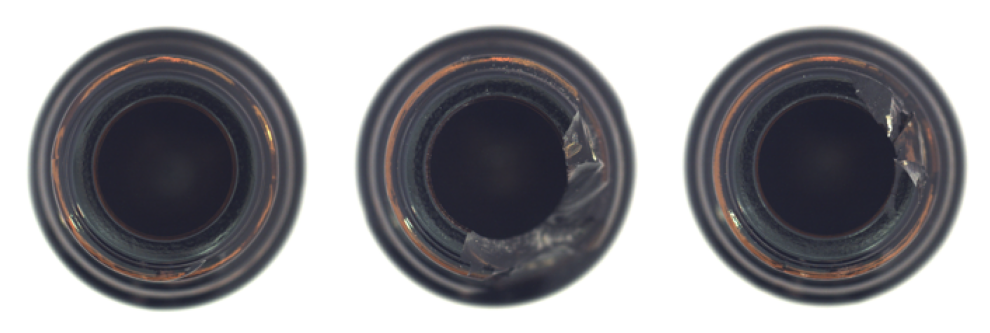

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>No. This bottle does not have any defects such as broken bottle and contaminated bottle, so it is non-defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>Yes. This bottle has some broken bottle, so it is defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>
Generated text:  Yes. This battery has some cracked battery,so it is defectiv.


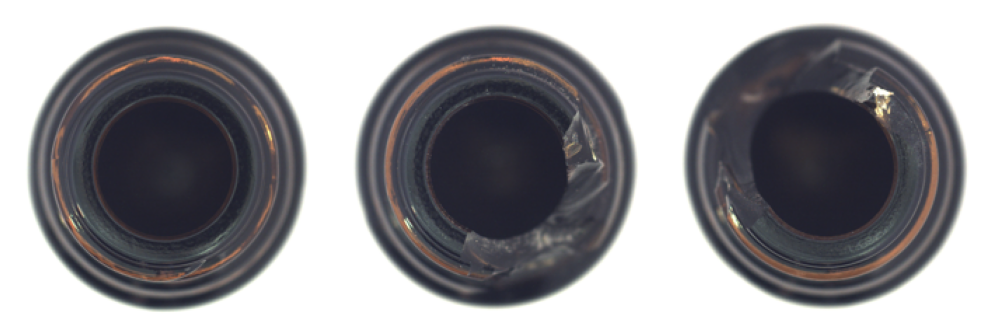

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>No. This bottle does not have any defects such as broken bottle and contaminated bottle, so it is non-defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>Yes. This bottle has some broken bottle, so it is defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>
Generated text:  Yes. This battery has some cracked battery,so it is defectiv.


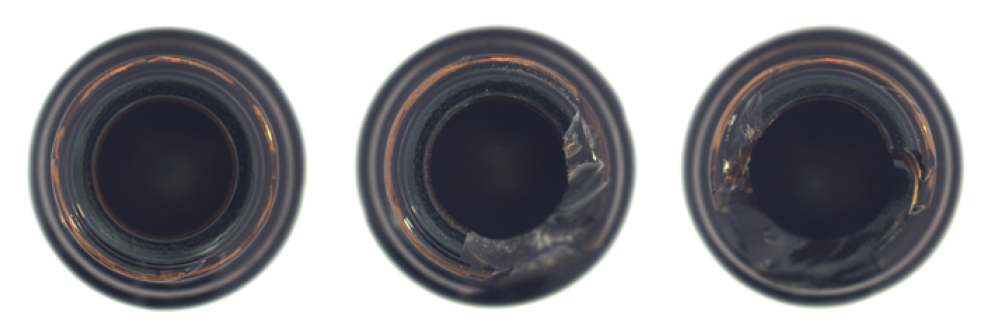

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>No. This bottle does not have any defects such as broken bottle and contaminated bottle, so it is non-defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>Yes. This bottle has some broken bottle, so it is defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>
Generated text:  Yes. This battery has some cracked bottle,so it is defectiv.


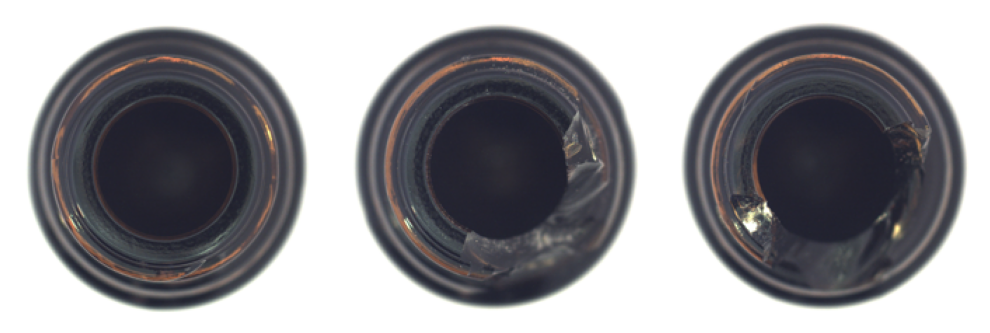

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>No. This bottle does not have any defects such as broken bottle and contaminated bottle, so it is non-defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>Yes. This bottle has some broken bottle, so it is defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>
Generated text:  Yes. This battery has some cracked bottle,so it is defectiv.


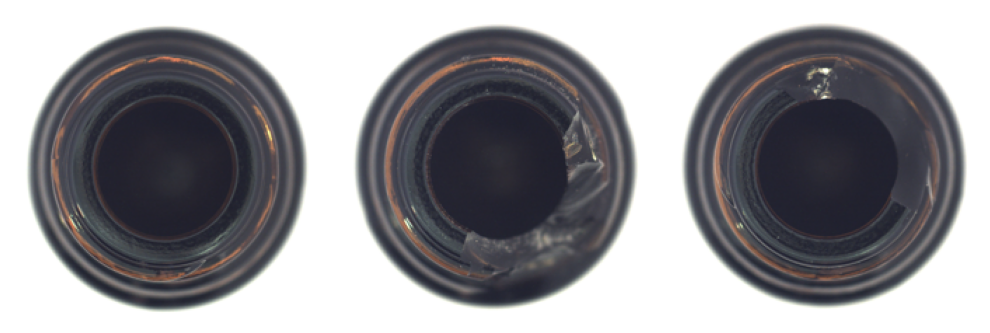

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>No. This bottle does not have any defects such as broken bottle and contaminated bottle, so it is non-defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>Yes. This bottle has some broken bottle, so it is defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>
Generated text:  Yes. This battery has somebroken bottle,so it is defectiv.


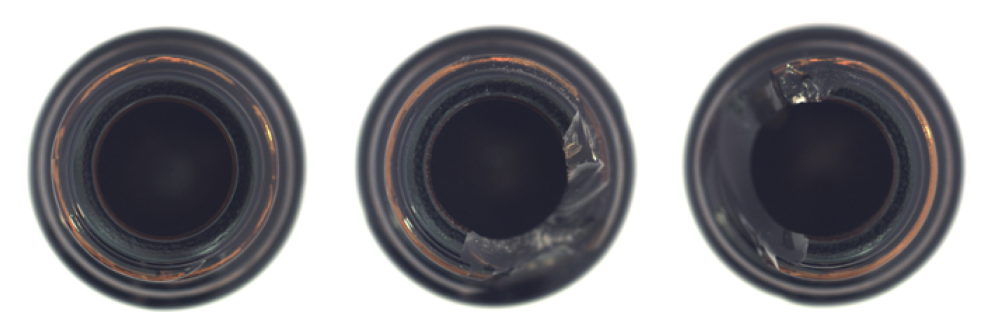

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>No. This bottle does not have any defects such as broken bottle and contaminated bottle, so it is non-defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>Yes. This bottle has some broken bottle, so it is defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>
Generated text:  Yes. This battery has some cracked battery,so it is defectiv.


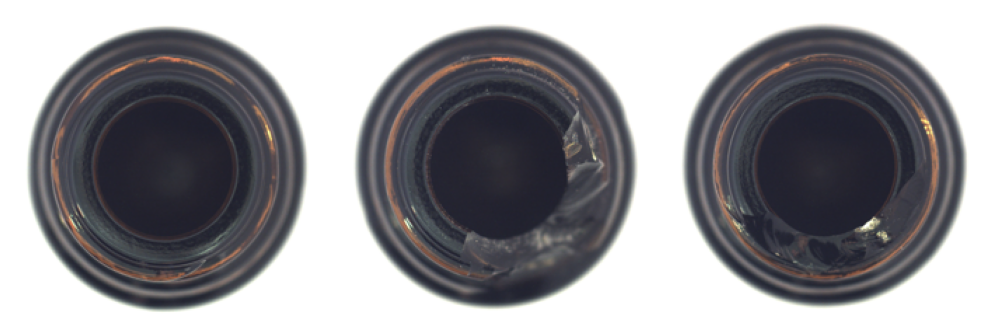

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>No. This bottle does not have any defects such as broken bottle and contaminated bottle, so it is non-defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>Yes. This bottle has some broken bottle, so it is defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>
Generated text:  YES. This bowl has some black bottle cap, so its defective. This question and its answer are both based on the assumption that a bottle is a cylindrical container with a circular opening at the top, so the term "bottle" refers to this type of container in this context.


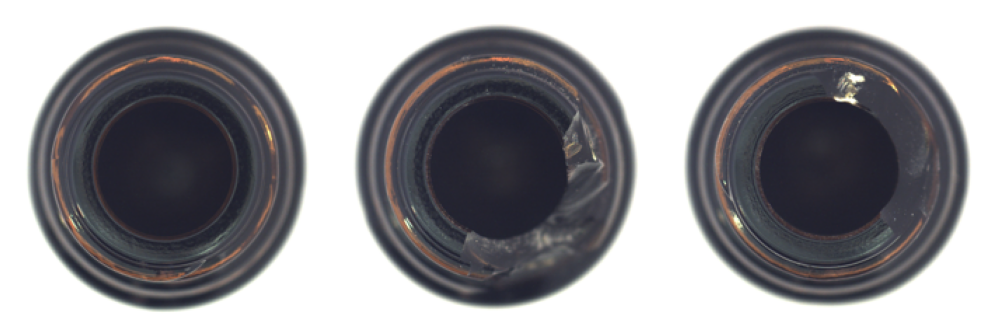

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>No. This bottle does not have any defects such as broken bottle and contaminated bottle, so it is non-defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>Yes. This bottle has some broken bottle, so it is defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>
Generated text:  Yes. This battery has some break bottle,so it is defectiv.


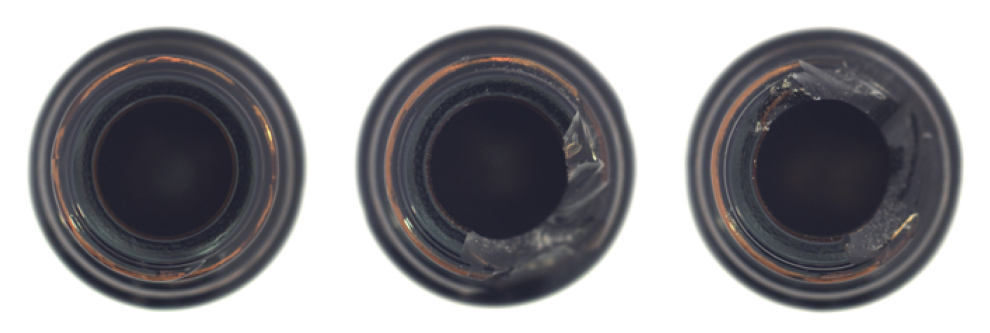

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>No. This bottle does not have any defects such as broken bottle and contaminated bottle, so it is non-defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>Yes. This bottle has some broken bottle, so it is defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>
Generated text:  Yes. This battery has some cracked battery,so it is defectiv.


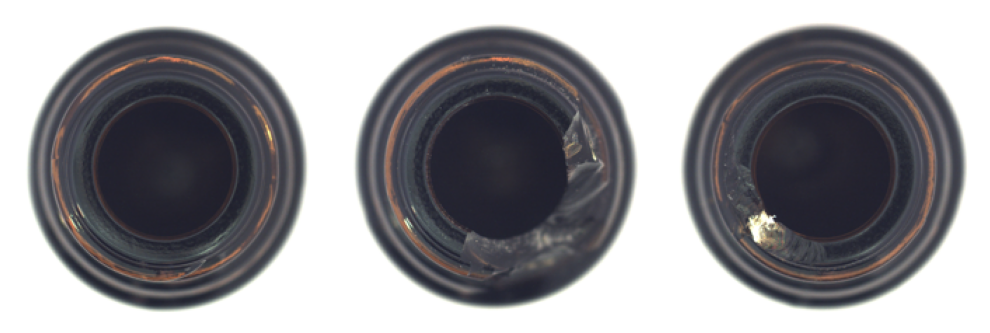

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>No. This bottle does not have any defects such as broken bottle and contaminated bottle, so it is non-defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>Yes. This bottle has some broken bottle, so it is defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>
Generated text:  Yes. This bowl has some broke bottle,so it is defectiv.


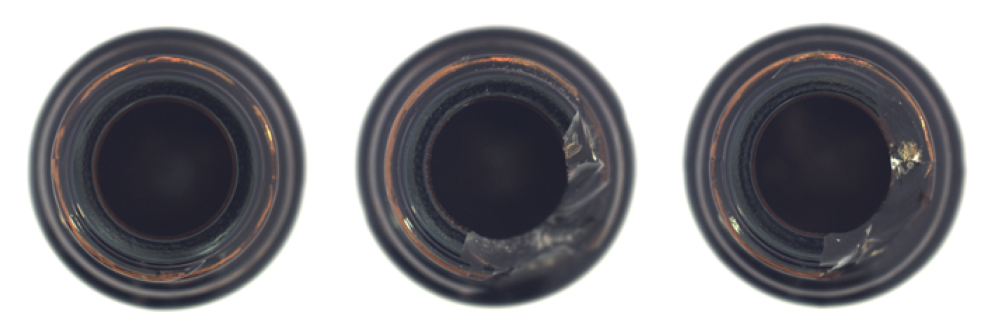

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>No. This bottle does not have any defects such as broken bottle and contaminated bottle, so it is non-defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>Yes. This bottle has some broken bottle, so it is defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>
Generated text:  Yes. This battery has some cracked battery,so it is defectiv.


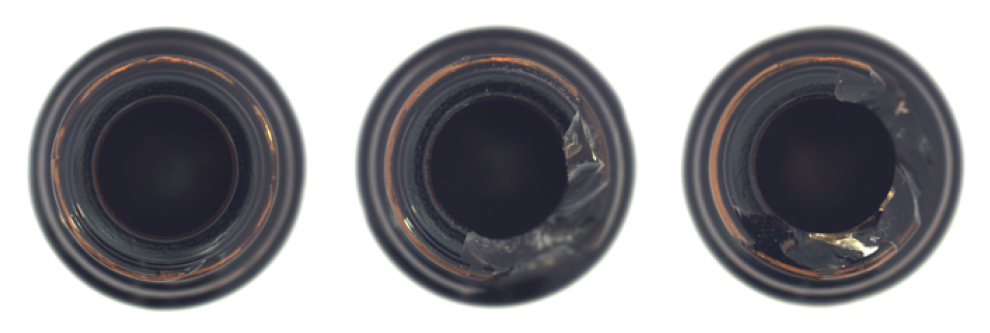

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>No. This bottle does not have any defects such as broken bottle and contaminated bottle, so it is non-defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>Yes. This bottle has some broken bottle, so it is defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>
Generated text:  Yes. This battery has some cracked bottle,so it is defectiv.


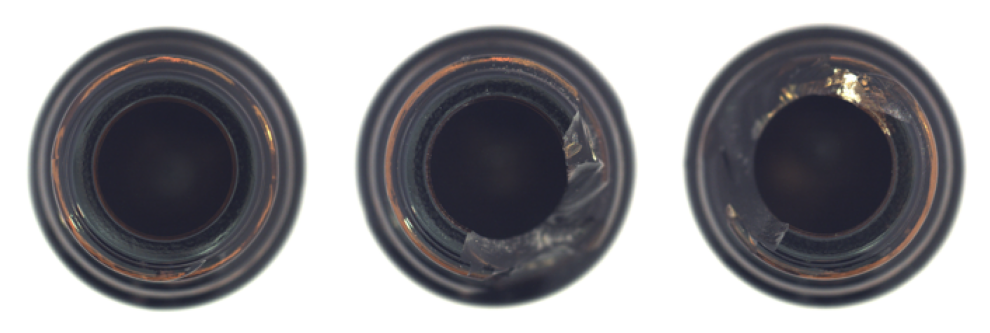

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>No. This bottle does not have any defects such as broken bottle and contaminated bottle, so it is non-defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>Yes. This bottle has some broken bottle, so it is defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>
Generated text:  Yes. This battery has some cracked battery,so it is defectiv.


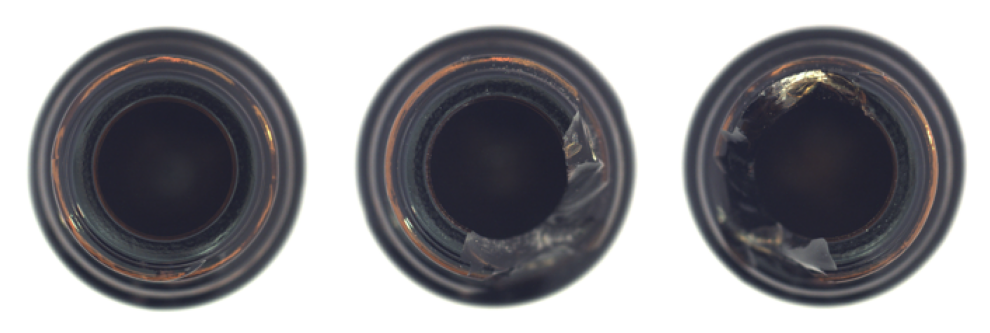

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>No. This bottle does not have any defects such as broken bottle and contaminated bottle, so it is non-defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>Yes. This bottle has some broken bottle, so it is defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>
Generated text:  Yes. This battery has some cracked battery,so it is defectiv.


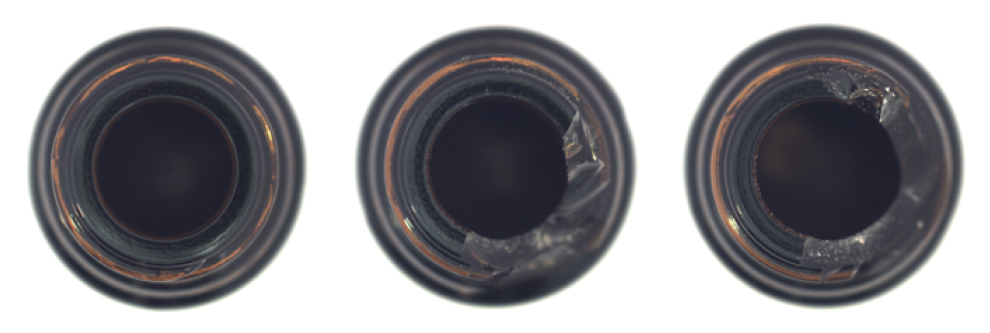

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>No. This bottle does not have any defects such as broken bottle and contaminated bottle, so it is non-defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>Yes. This bottle has some broken bottle, so it is defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>
Generated text:  Yes. This battery has some cracked bottle,so it is defectiv.


In [21]:
import textwrap
import random
import base64
import matplotlib.pyplot as plt
from PIL import Image
from io import BytesIO

folder__ = "bottle"
sub__ = "broken_large"
GTs = ['broken bottle','contaminated bottle']
gt = GTs[0]
subfolder_string = generate_list_string(GTs)
query_folder_path = f"/data/dataset/mvtec/{folder__}/test/{sub__}"
# query_folder_path = f"/data/dataset/mvtec/{folder__}/test/good"
query_image_paths = get_image_paths(query_folder_path)


demo_image_one = Image.open(f"/data/dataset/mvtec/{folder__}/test/good/000.png").resize((224, 224)).convert("RGB")
demo_image_two = Image.open(f"/data/dataset/mvtec/{folder__}/test/{sub__}/000.png").resize((224, 224)).convert("RGB")

for i, query_image_path in enumerate(query_image_paths[1:]):
    query_image = Image.open(query_image_path).resize((224, 224)).convert("RGB")            
            
    vision_x = image_processor.preprocess([demo_image_one, demo_image_two, query_image], return_tensors="pt")["pixel_values"].unsqueeze(1).unsqueeze(0)
    model.text_tokenizer.padding_side = "left"

    inputs = textwrap.dedent(f"""
                    <image>User: This is an image of {folder__}. Does this {folder__} have any defects such as {subfolder_string}? GPT:<answer>No. This {folder__} does not have any defects such as {subfolder_string}, so it is non-defective.<|endofchunk|>
                    <image>User: This is an image of {folder__}. Does this {folder__} have any defects such as {subfolder_string}? GPT:<answer>Yes. This {folder__} has some {gt}, so it is defective.<|endofchunk|>
                    <image>User: This is an image of {folder__}. Does this {folder__} have any defects such as {subfolder_string}? GPT:<answer>
    """)
    inputs = "".join(inputs.split("\n"))
    lang_x = model.text_tokenizer(
        [
            inputs
        ],
        return_tensors="pt",
    )

    # print(vision_x.shape) # torch.Size([1, 3, 1, 3, 224, 224]) shape (B, num_imgs, Frames=1, C, H, W)

    fig, axes = plt.subplots(1, 3, figsize=(10, 4))
    axes[0].imshow(demo_image_one)
    axes[0].axis('off')
    axes[1].imshow(demo_image_two)
    axes[1].axis('off')
    axes[2].imshow(query_image)
    axes[2].axis('off')
    plt.tight_layout()
    plt.show()

    # Get the data type from model's parameters
    model_dtype = next(model.parameters()).dtype

    # Convert tensors to the model's data type
    vision_x = vision_x.to(dtype=model_dtype)
    lang_x_input_ids = lang_x["input_ids"]
    lang_x_attention_mask = lang_x["attention_mask"]

    bad_words_id = model.text_tokenizer(["User:", "GPT1:", "GFT:", "GPT:"], add_special_tokens=False).input_ids
    generated_text = model.generate(
        vision_x=vision_x.to(model.device),
        lang_x=lang_x_input_ids.to(model.device),
        attention_mask=lang_x_attention_mask.to(model.device),
        max_new_tokens=512,
        num_beams=3,
        no_repeat_ngram_size=3,
        bad_words_ids=bad_words_id,
    )

    parsed_output = (
        model.text_tokenizer.decode(generated_text[0]).split("<answer>")[-1].lstrip().rstrip().split("<|endofchunk|>")[0].lstrip().rstrip().lstrip('"').rstrip('"')
    )
    print(inputs)
    print("Generated text: ", parsed_output)

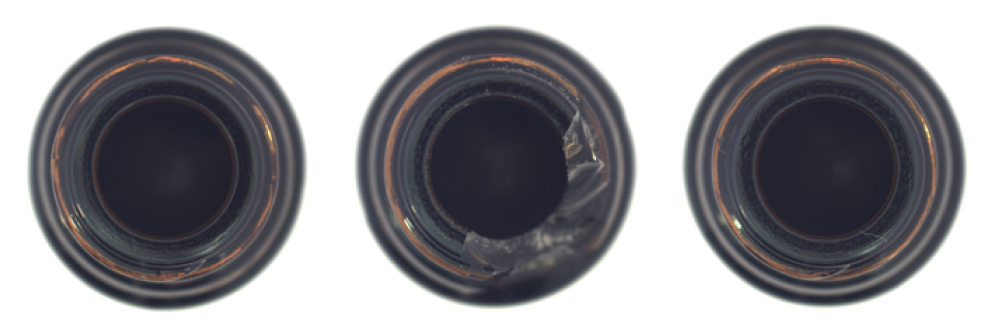

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>No. This bottle does not have any defects such as broken bottle and contaminated bottle, so it is non-defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>Yes. This bottle has some broken bottle, so it is defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>
Generated text:  YES. This bowl has some cracked bottle,so it is defectiv.


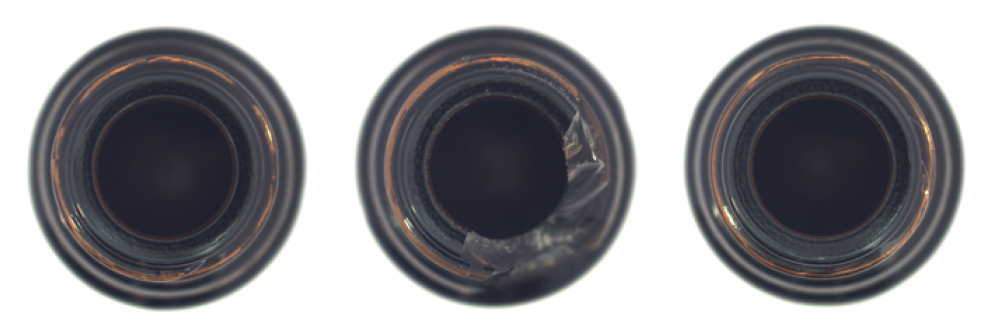

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>No. This bottle does not have any defects such as broken bottle and contaminated bottle, so it is non-defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>Yes. This bottle has some broken bottle, so it is defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>
Generated text:  YES. This bowl has some broke bottle,so it is defectiv.


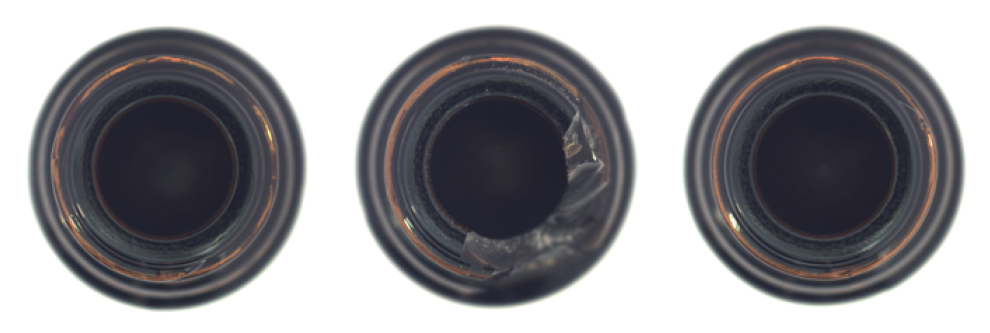

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>No. This bottle does not have any defects such as broken bottle and contaminated bottle, so it is non-defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>Yes. This bottle has some broken bottle, so it is defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>
Generated text:  YES. This bowl has some black bottle cap, so its defective..


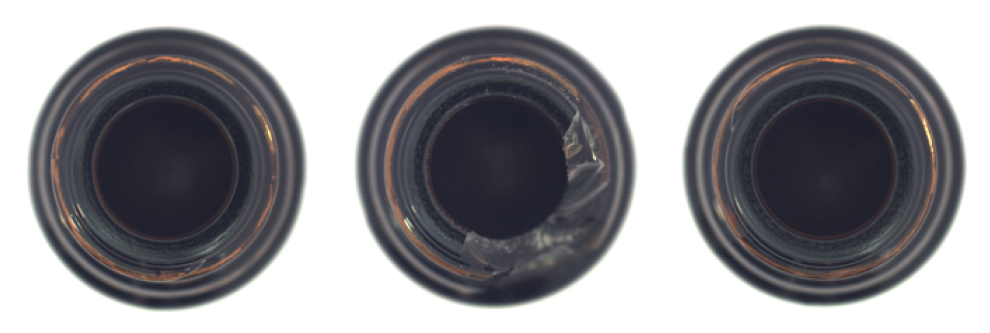

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>No. This bottle does not have any defects such as broken bottle and contaminated bottle, so it is non-defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>Yes. This bottle has some broken bottle, so it is defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>
Generated text:  YES. This bowl has some black bottle cap, so its defect type is color.


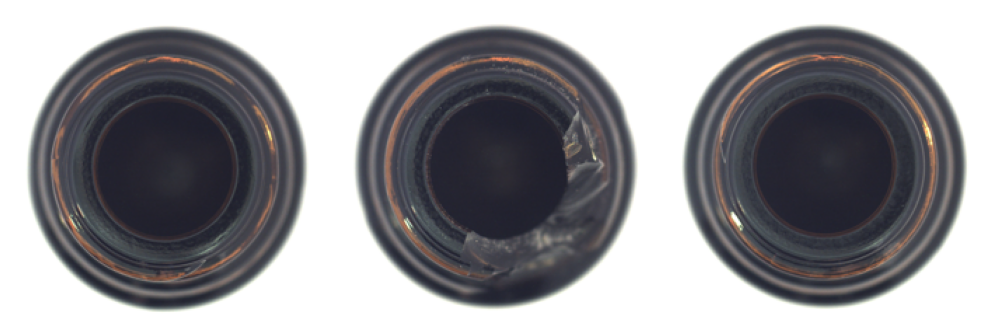

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>No. This bottle does not have any defects such as broken bottle and contaminated bottle, so it is non-defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>Yes. This bottle has some broken bottle, so it is defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>
Generated text:  Yes. This bowl has some broke bottle,so it is defectiv.


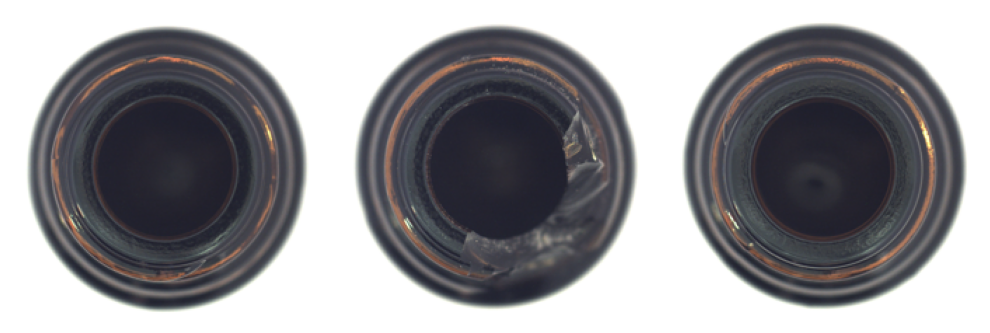

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>No. This bottle does not have any defects such as broken bottle and contaminated bottle, so it is non-defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>Yes. This bottle has some broken bottle, so it is defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>
Generated text:  Yes. This bowl has some broke bottle,so it is defectiv.


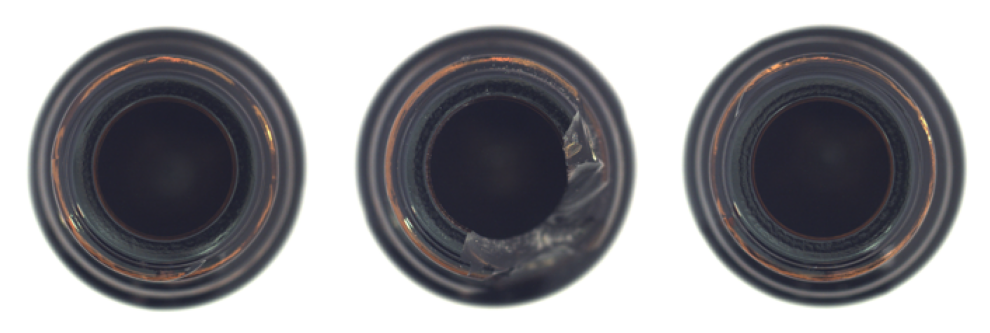

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>No. This bottle does not have any defects such as broken bottle and contaminated bottle, so it is non-defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>Yes. This bottle has some broken bottle, so it is defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>
Generated text:  YES. This bowl has some black bottle cap, so its defective. This question and its answer are both based on the assumption that a bottle is a cylindrical container with a circular opening at the top, so the term "bottle" refers to this type of container in this context.


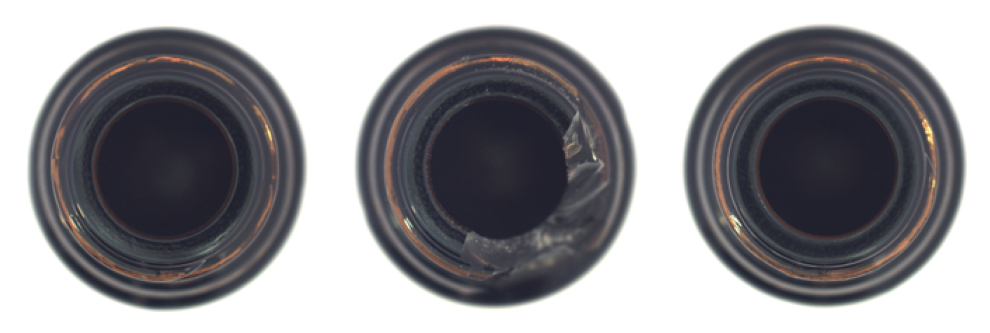

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>No. This bottle does not have any defects such as broken bottle and contaminated bottle, so it is non-defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>Yes. This bottle has some broken bottle, so it is defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>
Generated text:  YES. This bowl has some black bottle cap, so its defect type is bottle cap.


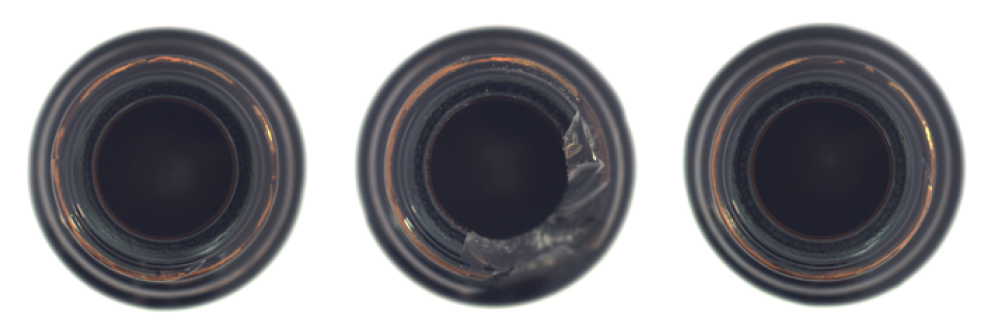

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>No. This bottle does not have any defects such as broken bottle and contaminated bottle, so it is non-defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>Yes. This bottle has some broken bottle, so it is defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>
Generated text:  YES. This bowl has some black bottle cap, so its defective. This question and its answer are both based on the assumption that a bottle is a cylindrical container with a circular opening at the top, so the term "bottle" refers to this type of container in this context.


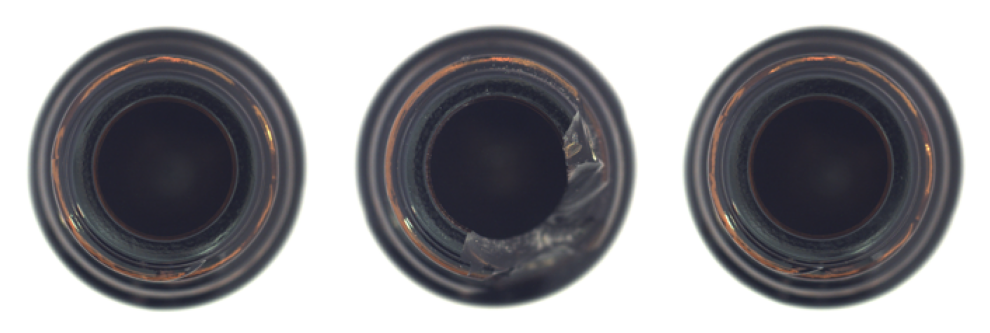

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>No. This bottle does not have any defects such as broken bottle and contaminated bottle, so it is non-defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>Yes. This bottle has some broken bottle, so it is defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>
Generated text:  Yes. This bowl has some cracked bowl,so it is defectiv.


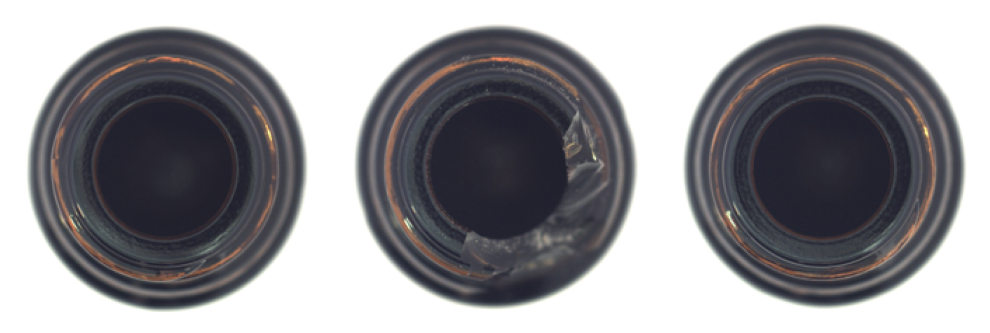

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>No. This bottle does not have any defects such as broken bottle and contaminated bottle, so it is non-defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>Yes. This bottle has some broken bottle, so it is defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>
Generated text:  YES. This bowl has some black bottle cap, so its defect type is different.


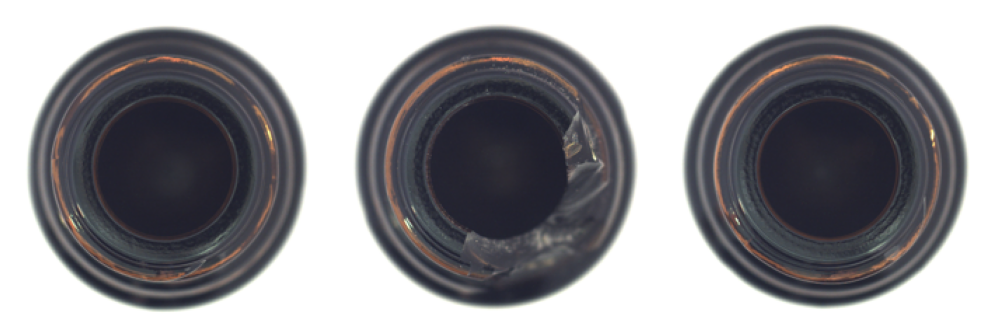

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>No. This bottle does not have any defects such as broken bottle and contaminated bottle, so it is non-defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>Yes. This bottle has some broken bottle, so it is defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>
Generated text:  Yes. This bowl has somebroken bottle,so it is defectiv.


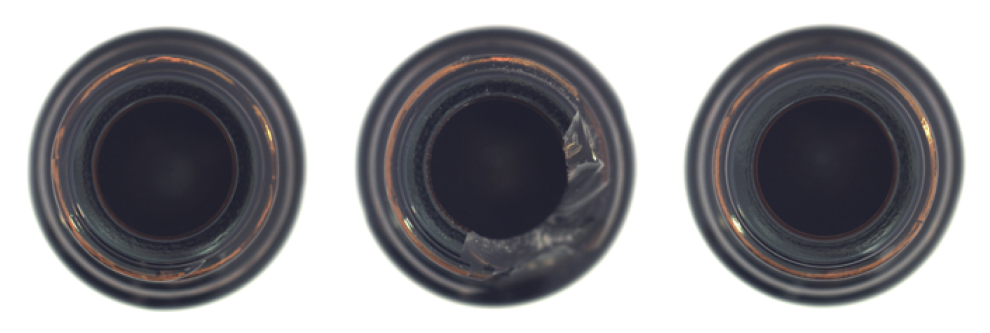

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>No. This bottle does not have any defects such as broken bottle and contaminated bottle, so it is non-defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>Yes. This bottle has some broken bottle, so it is defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>
Generated text:  YES. This bowl has some black bottle cap, so its defect type is color.


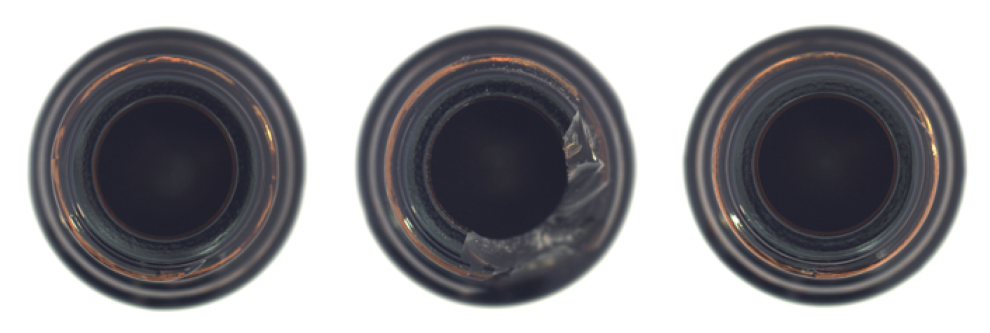

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>No. This bottle does not have any defects such as broken bottle and contaminated bottle, so it is non-defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>Yes. This bottle has some broken bottle, so it is defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>
Generated text:  YES. This bowl has some black bottle cap liner, so its defective..


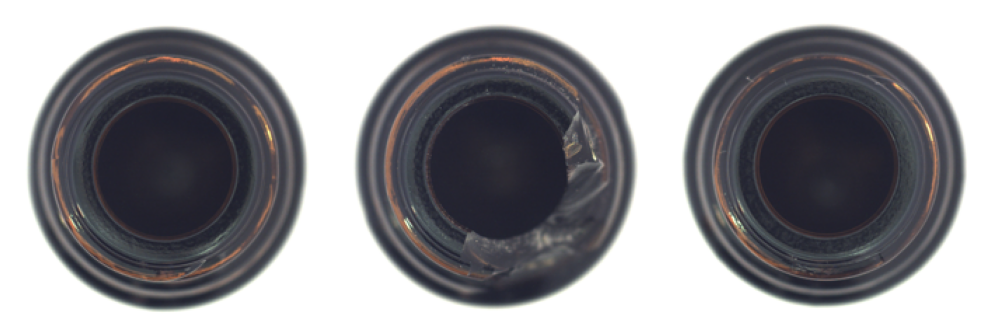

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>No. This bottle does not have any defects such as broken bottle and contaminated bottle, so it is non-defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>Yes. This bottle has some broken bottle, so it is defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>
Generated text:  YES. This bowl has some cracked bottle,so it is defectiv.


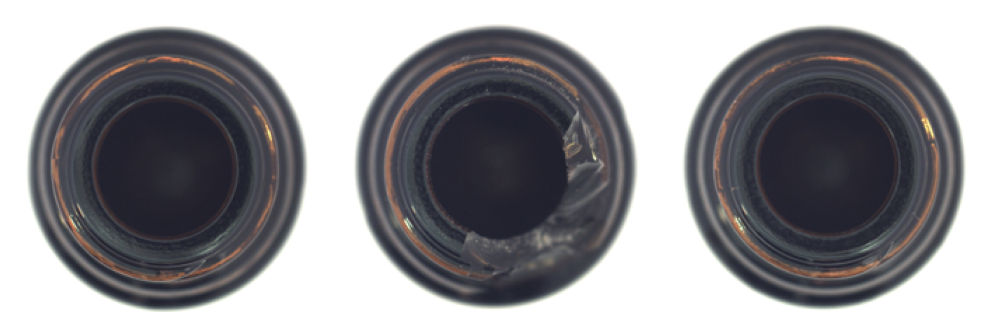

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>No. This bottle does not have any defects such as broken bottle and contaminated bottle, so it is non-defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>Yes. This bottle has some broken bottle, so it is defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>
Generated text:  YES. This bowl has some cracked bottle,so it is defectiv.


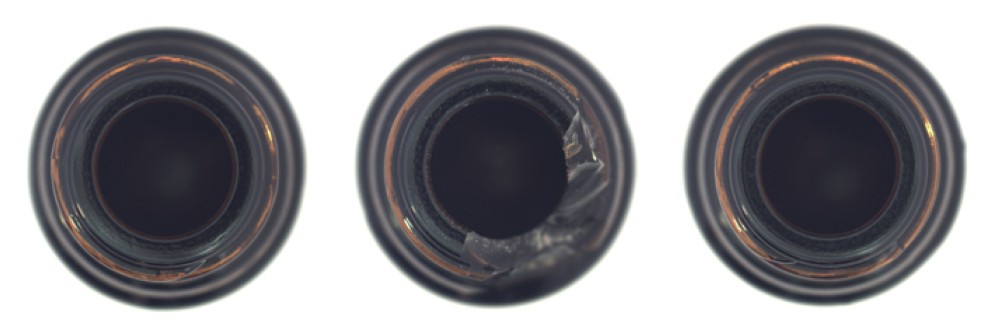

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>No. This bottle does not have any defects such as broken bottle and contaminated bottle, so it is non-defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>Yes. This bottle has some broken bottle, so it is defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>
Generated text:  YES. This bowl has some black bottle cap, so its defective. This question and its answer are both based on the assumption that the bottle in the image has some kind of defect, such as being broken or contaminated. However, this assumption is not confirmed, so the answer provided might not be accurate. To determine the accuracy of the answer, it is recommended to verify the bott

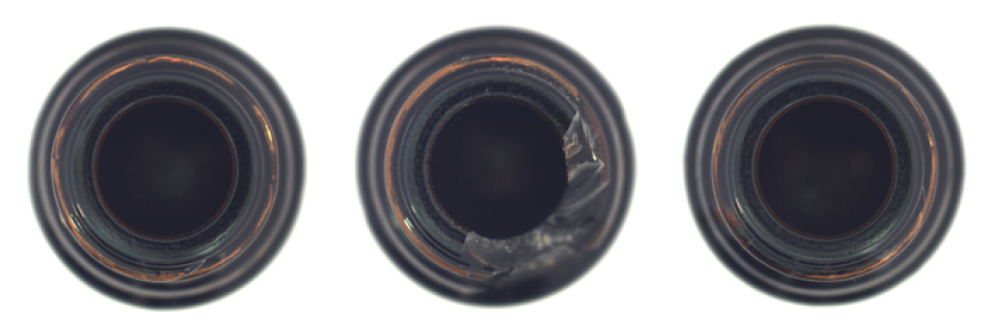

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>No. This bottle does not have any defects such as broken bottle and contaminated bottle, so it is non-defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>Yes. This bottle has some broken bottle, so it is defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>
Generated text:  Yes. This bowl has some broke bottle,so it is defectiv.


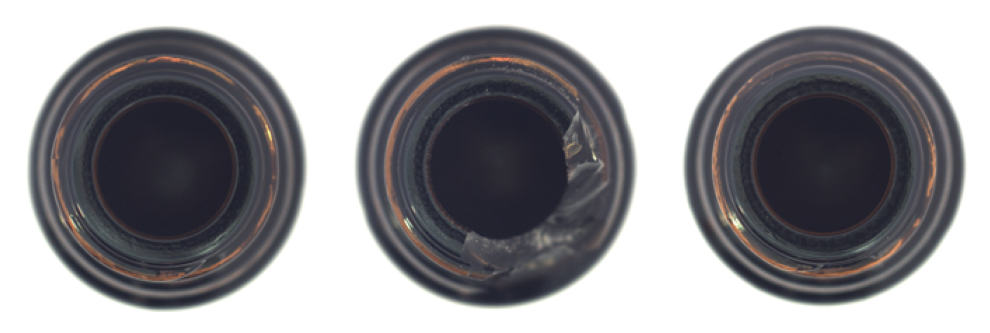

Setting `pad_token_id` to `eos_token_id`:50277 for open-end generation.


<image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>No. This bottle does not have any defects such as broken bottle and contaminated bottle, so it is non-defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>Yes. This bottle has some broken bottle, so it is defective.<|endofchunk|><image>User: This is an image of bottle. Does this bottle have any defects such as broken bottle and contaminated bottle? GPT:<answer>
Generated text:  YES. This bowl has some black bottle cap liner, so It is defectiv.


In [22]:
import textwrap
import random
import base64
import matplotlib.pyplot as plt
from PIL import Image
from io import BytesIO

folder__ = "bottle"
sub__ = "broken_large"
GTs = ['broken bottle','contaminated bottle']
gt = GTs[0]
subfolder_string = generate_list_string(GTs)
# query_folder_path = f"/data/dataset/mvtec/{folder__}/test/{sub__}"
query_folder_path = f"/data/dataset/mvtec/{folder__}/test/good"
query_image_paths = get_image_paths(query_folder_path)


demo_image_one = Image.open(f"/data/dataset/mvtec/{folder__}/test/good/000.png").resize((224, 224)).convert("RGB")
demo_image_two = Image.open(f"/data/dataset/mvtec/{folder__}/test/{sub__}/000.png").resize((224, 224)).convert("RGB")

for i, query_image_path in enumerate(query_image_paths[1:]):
    query_image = Image.open(query_image_path).resize((224, 224)).convert("RGB")            
            
    vision_x = image_processor.preprocess([demo_image_one, demo_image_two, query_image], return_tensors="pt")["pixel_values"].unsqueeze(1).unsqueeze(0)
    model.text_tokenizer.padding_side = "left"

    inputs = textwrap.dedent(f"""
                    <image>User: This is an image of {folder__}. Does this {folder__} have any defects such as {subfolder_string}? GPT:<answer>No. This {folder__} does not have any defects such as {subfolder_string}, so it is non-defective.<|endofchunk|>
                    <image>User: This is an image of {folder__}. Does this {folder__} have any defects such as {subfolder_string}? GPT:<answer>Yes. This {folder__} has some {gt}, so it is defective.<|endofchunk|>
                    <image>User: This is an image of {folder__}. Does this {folder__} have any defects such as {subfolder_string}? GPT:<answer>
    """)
    inputs = "".join(inputs.split("\n"))
    lang_x = model.text_tokenizer(
        [
            inputs
        ],
        return_tensors="pt",
    )

    # print(vision_x.shape) # torch.Size([1, 3, 1, 3, 224, 224]) shape (B, num_imgs, Frames=1, C, H, W)

    fig, axes = plt.subplots(1, 3, figsize=(10, 4))
    axes[0].imshow(demo_image_one)
    axes[0].axis('off')
    axes[1].imshow(demo_image_two)
    axes[1].axis('off')
    axes[2].imshow(query_image)
    axes[2].axis('off')
    plt.tight_layout()
    plt.show()

    # Get the data type from model's parameters
    model_dtype = next(model.parameters()).dtype

    # Convert tensors to the model's data type
    vision_x = vision_x.to(dtype=model_dtype)
    lang_x_input_ids = lang_x["input_ids"]
    lang_x_attention_mask = lang_x["attention_mask"]

    bad_words_id = model.text_tokenizer(["User:", "GPT1:", "GFT:", "GPT:"], add_special_tokens=False).input_ids
    generated_text = model.generate(
        vision_x=vision_x.to(model.device),
        lang_x=lang_x_input_ids.to(model.device),
        attention_mask=lang_x_attention_mask.to(model.device),
        max_new_tokens=512,
        num_beams=3,
        no_repeat_ngram_size=3,
        bad_words_ids=bad_words_id,
    )

    parsed_output = (
        model.text_tokenizer.decode(generated_text[0]).split("<answer>")[-1].lstrip().rstrip().split("<|endofchunk|>")[0].lstrip().rstrip().lstrip('"').rstrip('"')
    )
    print(inputs)
    print("Generated text: ", parsed_output)